# Оценка матрицы гомографии между соседними кадрами

Практикуемся в использовании методов компьютерного зрения для оценки геометрии сцены. Решаем задачу оценки матрицы гомографии между двумя видеокадрами.

### Установим и импортируем все требуемые зависимости

In [ ]:
%pip install kornia_moons

In [28]:
import cv2
import numpy as np
import torch  

import kornia
from kornia import image_to_tensor, tensor_to_image
from kornia.color import bgr_to_rgb, rgb_to_grayscale, bgr_to_grayscale
from kornia.geometry import get_perspective_transform, warp_perspective, RANSAC
from kornia.feature import LoFTR, laf_from_center_scale_ori
from kornia_moons.feature import draw_LAF_matches
from kornia.geometry.homography import find_homography_dlt
from kornia.feature import SOLD2    
from kornia.contrib import ImageStitcher

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib

from utils import plot_images, plot_lines, plot_color_line_matches, draw_polyline

## Первая пара indoor-изображений 

Найдем матрицу гомографии с помощью особых точек

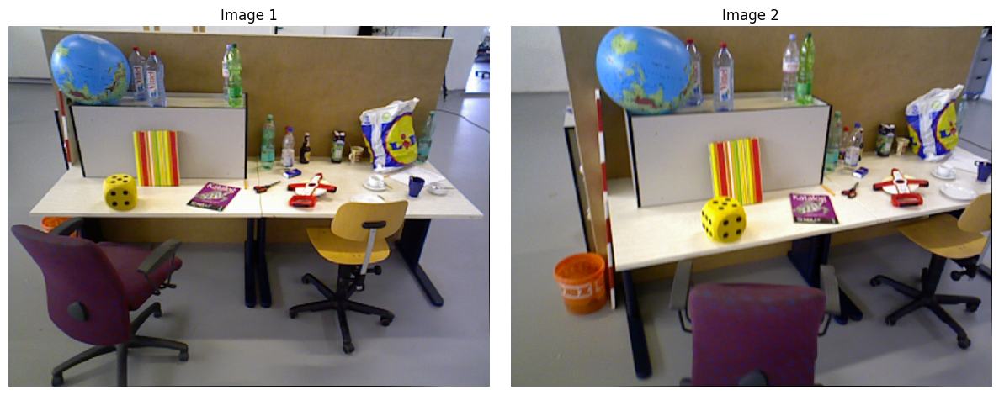

In [3]:
img1 = image_to_tensor(cv2.imread('./sample_1/img_1.png'), False).float() /255.
img1 = bgr_to_rgb(img1)
img2 = image_to_tensor(cv2.imread('./sample_1/img_2.png'), False).float() /255.
img2 = bgr_to_rgb(img2)

batch = {
    "image0": rgb_to_grayscale(img1),
    "image1": rgb_to_grayscale(img2)
}

plot_images([tensor_to_image(img1), tensor_to_image(img2)], ["Image 1", "Image 2"])

Downloading: "http://cmp.felk.cvut.cz/~mishkdmy/models/loftr_indoor.ckpt" to /tmp/xdg_cache/torch/hub/checkpoints/loftr_indoor.ckpt
100%|██████████| 44.2M/44.2M [00:00<00:00, 46.4MB/s]


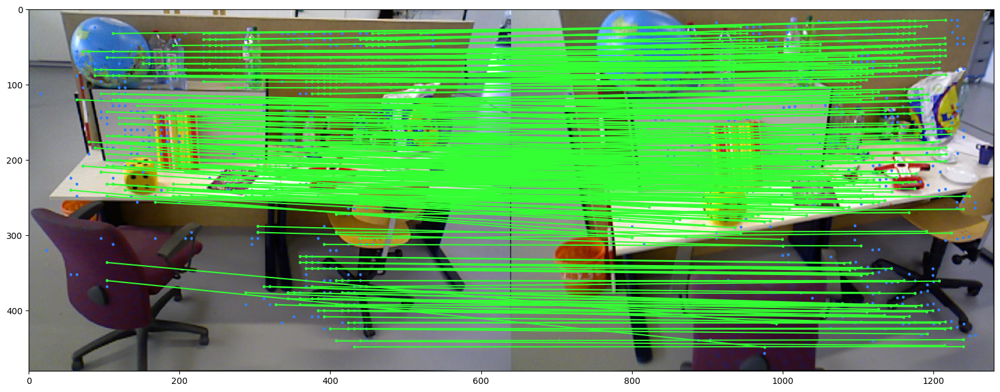

In [4]:
matcher = LoFTR(pretrained='indoor')

with torch.inference_mode():
    correspondences = matcher(batch)
    
mkpts0_raw = correspondences['keypoints0'].cpu().numpy()
mkpts1_raw = correspondences['keypoints1'].cpu().numpy()
confidence = correspondences['confidence'].cpu().numpy()

mkpts0, mkpts1 = [], []
for conf, p1, p2 in zip(confidence, mkpts0_raw, mkpts1_raw):
    if conf >= .99:                                
        mkpts0.append(p1)                                   
        mkpts1.append(p2)

mkpts0 = np.array(mkpts0)
mkpts1 = np.array(mkpts1)

_, inliers = cv2.findFundamentalMat(mkpts0, mkpts1, cv2.USAC_MAGSAC, 0.5, 0.999, 100000)
inliers = inliers > 0

draw_LAF_matches(
    laf_from_center_scale_ori(torch.from_numpy(mkpts0).view(1,-1, 2),
                              torch.ones(mkpts0.shape[0]).view(1,-1, 1, 1),
                              torch.ones(mkpts0.shape[0]).view(1,-1, 1)),

    laf_from_center_scale_ori(torch.from_numpy(mkpts1).view(1,-1, 2),
                              torch.ones(mkpts1.shape[0]).view(1,-1, 1, 1),
                              torch.ones(mkpts1.shape[0]).view(1,-1, 1)),
    torch.arange(mkpts0.shape[0]).view(-1,1).repeat(1,2),
    tensor_to_image(img1),
    tensor_to_image(img2),
    inliers,
    draw_dict={'inlier_color': (0.2, 1, 0.2),
               'tentative_color': None, 
               'feature_color': (0.2, 0.5, 1), 'vertical': False})

In [5]:
batch_1 = correspondences['keypoints0'].unsqueeze(0)
batch_2 = correspondences['keypoints1'].unsqueeze(0)

theta = find_homography_dlt(batch_1, batch_2)
print('Матрица гомографии:\n', theta)

Матрица гомографии:
 tensor([[[ 1.8763e+00,  7.0452e-01, -6.8721e+01],
         [ 7.8084e-02,  1.8845e+00, -7.3785e+01],
         [ 1.2730e-03,  6.3440e-04,  1.0000e+00]]])


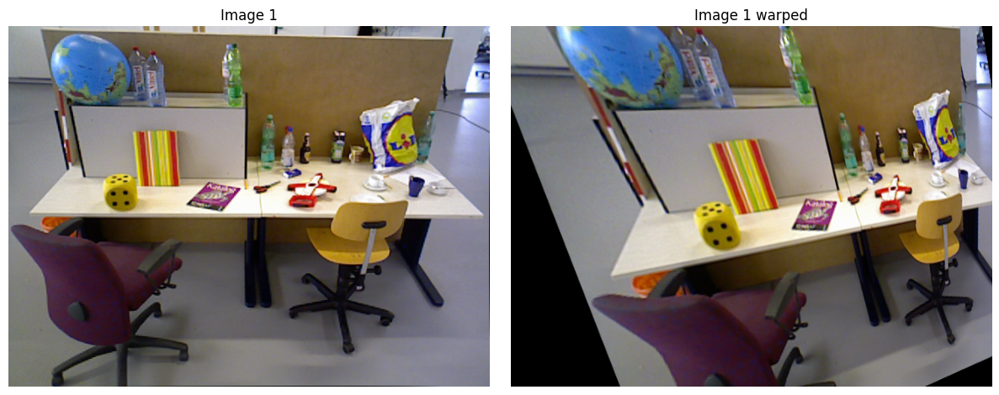

In [6]:
img1_warp = warp_perspective(img1, theta, dsize=(480, 640))
plot_images([tensor_to_image(img1), tensor_to_image(img1_warp)], ["Image 1", "Image 1 warped"])

Нарисуем четырехугольник левого стола, на исходных изображениях

In [7]:
poly = torch.tensor([[84, 179], [330, 173], [338, 250], [30, 251]])

poly_homogeneous = torch.cat((poly, torch.ones(poly.size(0), 1)), dim=1) 
transformed_poly = poly_homogeneous @ theta[0].t()
transformed_poly /= transformed_poly[:, 2].unsqueeze(1)
transformed_poly = transformed_poly[:, :2]

img1_poly = draw_polyline(img1[0], poly)
img1_warp_poly = draw_polyline(img2[0], transformed_poly)

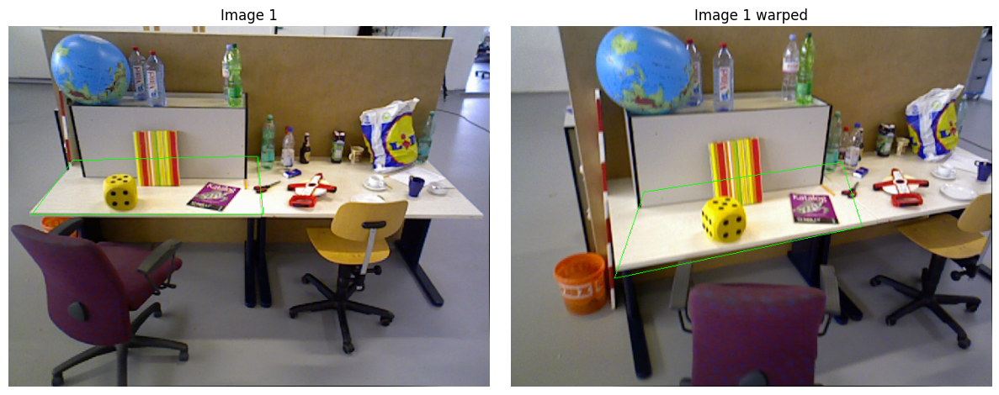

In [8]:
plot_images([tensor_to_image(img1_poly), tensor_to_image(img1_warp_poly)], ["Image 1", "Image 1 warped"])

Как видно, результат не идеален, но это ожидаемо, так как матрицу гомографии оцениваем по точкам, не лежащим на одной плоскости 

## Вторая пара изображений спортивного состязания

Найдем матрицу гомографии с помощью линий, так как особые точки здесь хуже применимы из-за движений игроков

torch.Size([2, 1, 720, 1280])


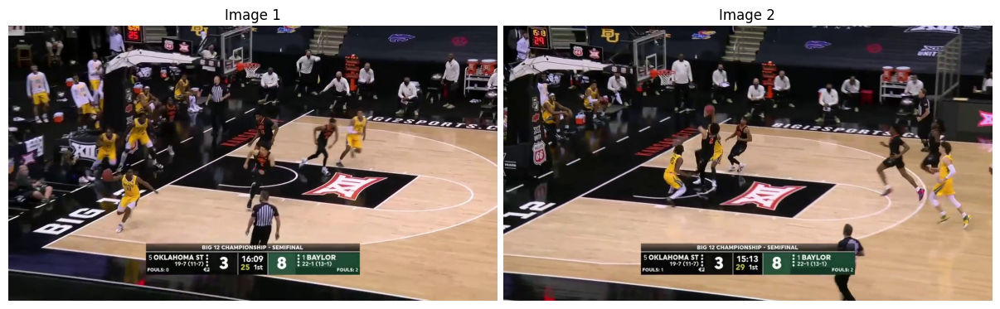

In [9]:
img1 = cv2.imread('./sample_2/img_1.jpeg')
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.imread('./sample_2/img_2.jpeg')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

img1 = image_to_tensor(img1).float() / 255.0 
img2 = image_to_tensor(img2).float() / 255.0
img1_gray = bgr_to_grayscale(img1)      
img2_gray = bgr_to_grayscale(img2)
batch = torch.stack([img1_gray, img2_gray])

imgs_to_plot = [tensor_to_image(img1), tensor_to_image(img2)]
plot_images(imgs_to_plot, ["Image 1", "Image 2"])
print(batch.shape)

Оставляем только линии самой площадки, отфильтровав линии табло со счетом (используем bbox этой плашки)

Downloading: "http://cmp.felk.cvut.cz/~mishkdmy/models/sold2_wireframe.pth" to /tmp/xdg_cache/torch/hub/checkpoints/sold2_wireframe.pth
100%|██████████| 140M/140M [00:02<00:00, 60.0MB/s] 


Все линии: torch.Size([261, 2, 2]) torch.Size([285, 2, 2])
Все вне табло: torch.Size([193, 2, 2]) torch.Size([214, 2, 2])
torch.Size([65, 2, 2]) torch.Size([65, 2, 2])


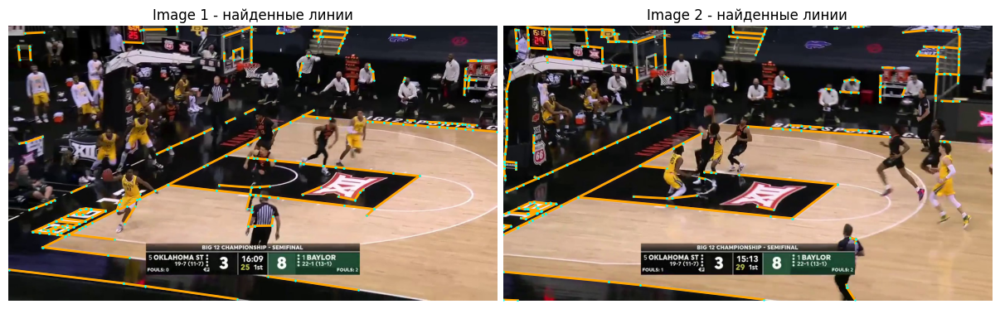

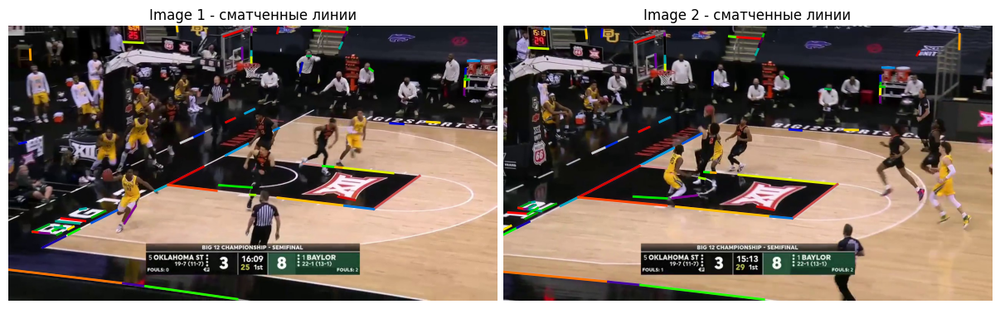

In [10]:
sold2 = SOLD2(pretrained=True, config=None)

with torch.inference_mode():
    outputs = sold2(batch)

line_seg1 = outputs["line_segments"][0]
line_seg2 = outputs["line_segments"][1]
desc1 = outputs["dense_desc"][0]
desc2 = outputs["dense_desc"][1]
print ('Все линии:', line_seg1.shape, line_seg2.shape)

# bbox плашки со счетом в формате (x_min, y_min, x_max, y_max)
bbox = (567, 358, 655, 922)

def is_line_outside_bbox(line, bbox):
    x_min, y_min, x_max, y_max = bbox
    p1, p2 = line[0], line[1]

    # Проверяем, находятся ли обе точки вне bbox
    return (p1[0] < x_min and p2[0] < x_min) or \
           (p1[0] > x_max and p2[0] > x_max) or \
           (p1[1] < y_min and p2[1] < y_min) or \
           (p1[1] > y_max and p2[1] > y_max)

mask = torch.tensor([is_line_outside_bbox(line, bbox) for line in line_seg1])
line_seg1 = line_seg1[mask]

mask = torch.tensor([is_line_outside_bbox(line, bbox) for line in line_seg2])
line_seg2 = line_seg2[mask]

print ('Все вне табло:', line_seg1.shape, line_seg2.shape)

with torch.inference_mode():
    matches = sold2.match(line_seg1, line_seg2, desc1[None], desc2[None])

valid_matches = matches != -1
match_indices = matches[valid_matches]
matched_lines1 = line_seg1[valid_matches]
matched_lines2 = line_seg2[match_indices]
print (matched_lines1.shape, matched_lines2.shape)

imgs_to_plot = [tensor_to_image(img1), tensor_to_image(img2)]
lines_to_plot = [line_seg1.numpy(), line_seg2.numpy()]

plot_images(imgs_to_plot, ["Image 1 - найденные линии", "Image 2 - найденные линии"])
plot_lines(lines_to_plot, ps=3, lw=2, indices={0, 1})

plot_images(imgs_to_plot, ["Image 1 - сматченные линии", "Image 2 - сматченные линии"])
plot_color_line_matches([matched_lines1, matched_lines2], lw=2)

Матрица гомографии:
 tensor([[ 1.0638e+00, -5.6223e-03, -2.5242e+02],
        [ 9.5091e-03,  9.8816e-01,  2.0733e+01],
        [ 4.1470e-05, -9.9341e-05,  1.0000e+00]])


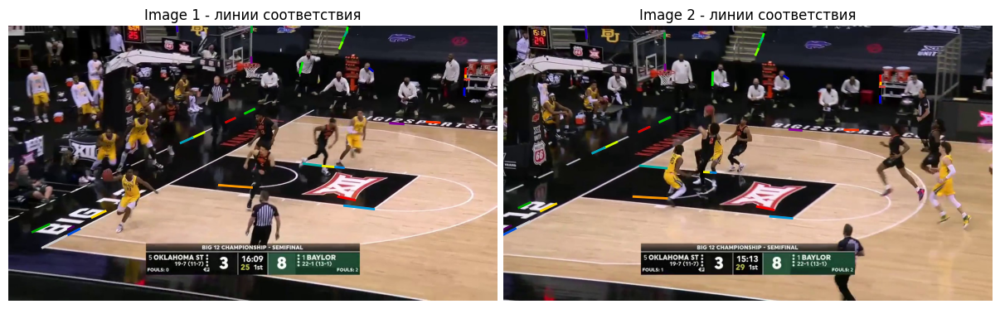

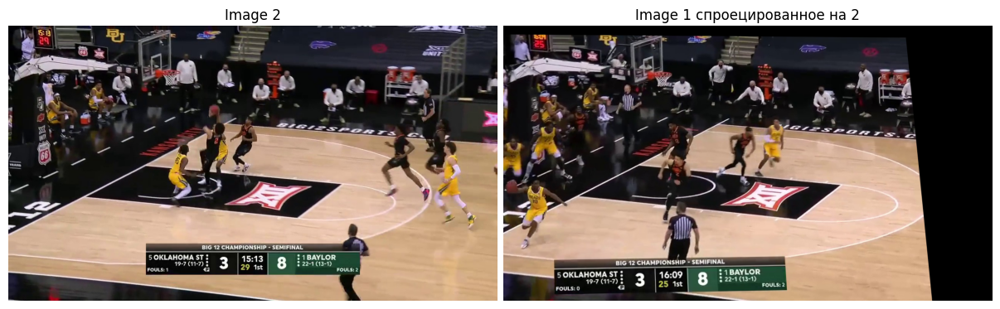

In [11]:
ransac = RANSAC(model_type="homography_from_linesegments", inl_th=150.0, confidence=0.9)

theta, correspondence_mask = ransac(matched_lines1.flip(dims=(2,)), matched_lines2.flip(dims=(2,)))

print(f'Матрица гомографии:\n {theta}')

img1_warp_to2 = warp_perspective(img1[None], theta[None], (img1.shape[1:]))

plot_images(imgs_to_plot, ["Image 1 - линии соответствия", "Image 2 - линии соответствия"])
plot_color_line_matches([matched_lines1[correspondence_mask], matched_lines2[correspondence_mask]], lw=2)

plot_images([tensor_to_image(img2), tensor_to_image(img1_warp_to2)],["Image 2", "Image 1 спроецированное на 2"])

Нарисуем четырехугольник черной площадки перед линией штрафного броска и спроецируем его на второе изображение

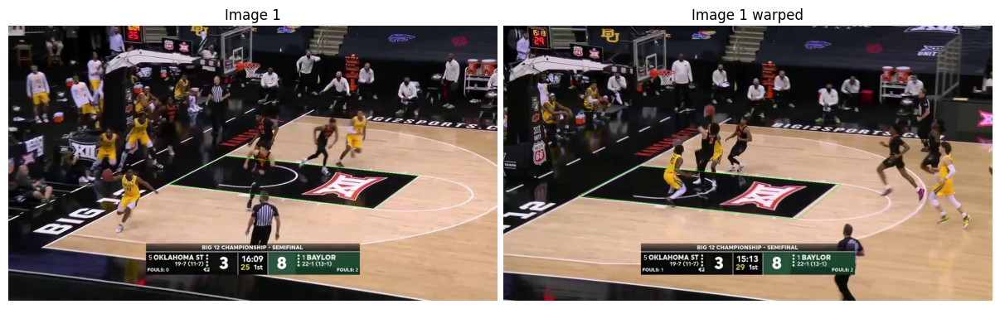

In [27]:
poly = torch.tensor([[569, 340], [1074, 392], [957, 479], [420, 415]])

poly_homogeneous = torch.cat((poly, torch.ones(poly.size(0), 1)), dim=1) 
transformed_poly = poly_homogeneous @ theta.t()
transformed_poly /= transformed_poly[:, 2].unsqueeze(1)
transformed_poly = transformed_poly[:, :2]

img1_poly = draw_polyline(bgr_to_rgb(img1[0]), poly)
img1_warp_poly = draw_polyline(bgr_to_rgb(img2[0]), transformed_poly)

plot_images([tensor_to_image(img1_poly), tensor_to_image(img1_warp_poly)], ["Image 1", "Image 1 warped"])

Результат гораздо лучше примера со столом, так как матрицу гомографии оценивали по плоскости площадки

Сделаем панорамное изображение

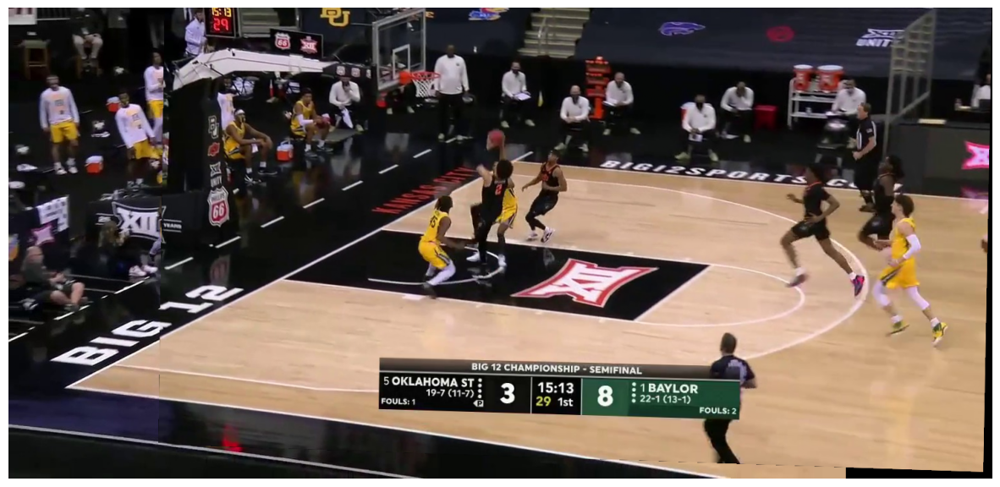

In [30]:
plt.rcParams['figure.figsize'] = [15, 10]    # set up veiw

IMG_PATH_1 = "./sample_2/img_1.jpeg"
IMG_PATH_2 = "./sample_2/img_2.jpeg"

img1 = image_to_tensor(cv2.imread(IMG_PATH_1), False).float() /255.
img2 = image_to_tensor(cv2.imread(IMG_PATH_2), False).float() /255.

stitcher = ImageStitcher(LoFTR(pretrained='outdoor'), estimator='ransac')

with torch.inference_mode():
    panorama = stitcher(*[img1, img2])
   
plt.imshow(tensor_to_image(panorama)[...,::-1])
plt.axis('off')
plt.show()

## Третья пара изображений

Историческое (1933) и современное (2023) изображений одного и того же места. 

Метод может применяться для автоматизации совмещения снимков аналогично https://121clicks.com/inspirations/photos-taken-same-location-at-different-points-in-time

libpng warning: iCCP: extra compressed data
libpng warning: iCCP: extra compressed data


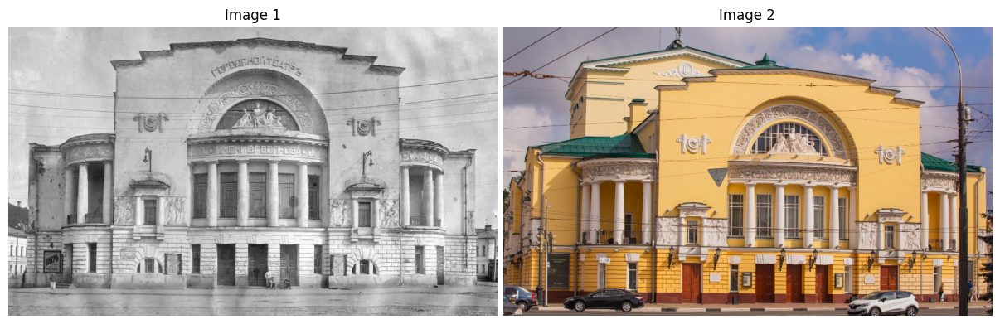

In [32]:
img1 = image_to_tensor(cv2.imread('./sample_3/img_1.png'), False).float() /255.
img1 = bgr_to_rgb(img1)
img2 = image_to_tensor(cv2.imread('./sample_3/img_2.png'), False).float() /255.
img2 = bgr_to_rgb(img2)

batch = {
    "image0": rgb_to_grayscale(img1),
    "image1": rgb_to_grayscale(img2)
}

plot_images([tensor_to_image(img1), tensor_to_image(img2)], ["Image 1", "Image 2"])

Найдем и сопоставим особые точки. В силу специфики данных уменьшаем confidence, используем предобученную outdoor-модель

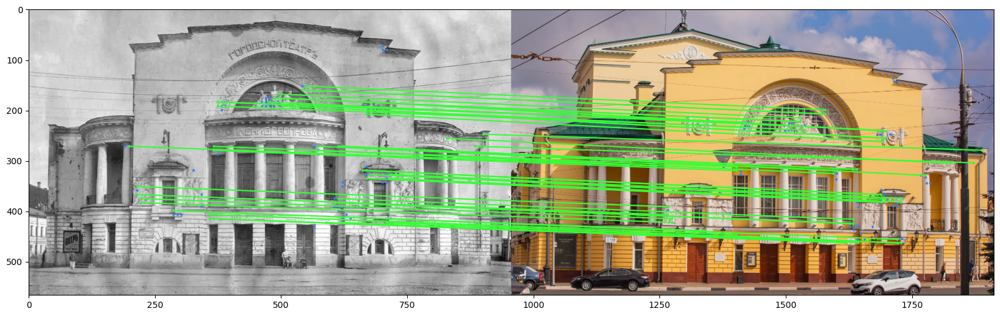

In [64]:
matcher = LoFTR(pretrained='outdoor')

with torch.inference_mode():
    correspondences = matcher(batch)
    
mkpts0_raw = correspondences['keypoints0'].cpu().numpy()
mkpts1_raw = correspondences['keypoints1'].cpu().numpy()
confidence = correspondences['confidence'].cpu().numpy()

mkpts0, mkpts1 = [], []
for conf, p1, p2 in zip(confidence, mkpts0_raw, mkpts1_raw):
    if conf >= .9:                                
        mkpts0.append(p1)                                   
        mkpts1.append(p2)

mkpts0 = np.array(mkpts0)
mkpts1 = np.array(mkpts1)

_, inliers = cv2.findFundamentalMat(mkpts0, mkpts1, cv2.USAC_MAGSAC, 0.5, 0.999, 100000)
inliers = inliers > 0

draw_LAF_matches(
    laf_from_center_scale_ori(torch.from_numpy(mkpts0).view(1,-1, 2),
                              torch.ones(mkpts0.shape[0]).view(1,-1, 1, 1),
                              torch.ones(mkpts0.shape[0]).view(1,-1, 1)),

    laf_from_center_scale_ori(torch.from_numpy(mkpts1).view(1,-1, 2),
                              torch.ones(mkpts1.shape[0]).view(1,-1, 1, 1),
                              torch.ones(mkpts1.shape[0]).view(1,-1, 1)),
    torch.arange(mkpts0.shape[0]).view(-1,1).repeat(1,2),
    tensor_to_image(img1),
    tensor_to_image(img2),
    inliers,
    draw_dict={'inlier_color': (0.2, 1, 0.2),
               'tentative_color': None, 
               'feature_color': (0.2, 0.5, 1), 'vertical': False})

In [65]:
batch_1 = correspondences['keypoints0'].unsqueeze(0)
batch_2 = correspondences['keypoints1'].unsqueeze(0)

theta = find_homography_dlt(batch_1, batch_2)
print('Матрица гомографии:\n', theta)

Матрица гомографии:
 tensor([[[1.2528e+00, 5.3308e-02, 2.7017e+01],
         [1.1309e-01, 1.1249e+00, 6.1561e+00],
         [2.8209e-04, 5.5396e-05, 1.0000e+00]]])


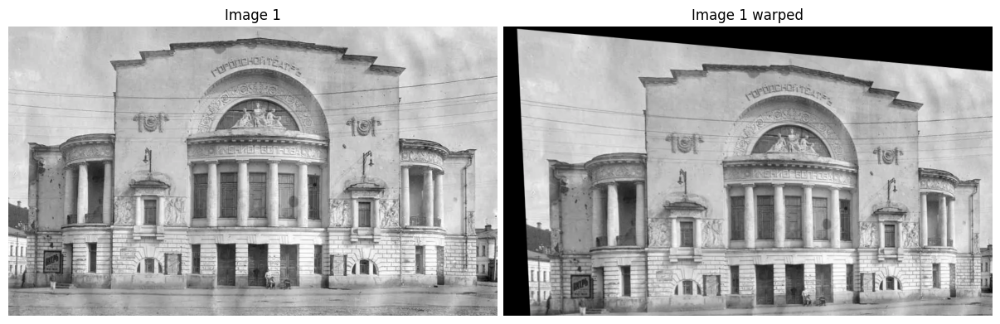

In [66]:
img1_warp = warp_perspective(img1, theta, dsize=(566, 956))
plot_images([tensor_to_image(img1), tensor_to_image(img1_warp)], ["Image 1", "Image 1 warped"])

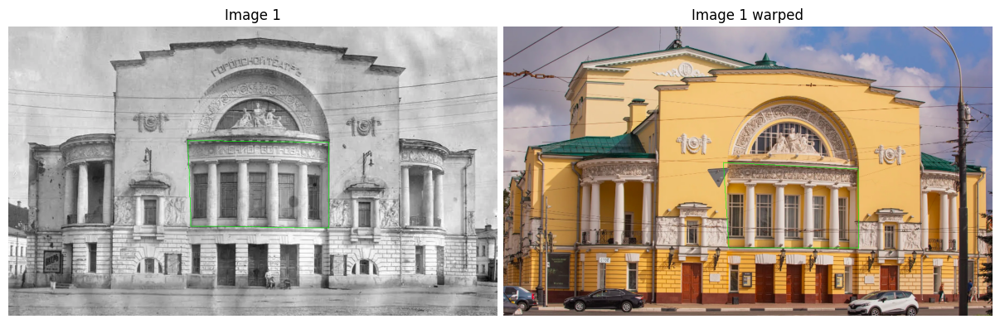

In [67]:
poly = torch.tensor([[351, 223], [626, 227], [626, 395], [357, 391]])

poly_homogeneous = torch.cat((poly, torch.ones(poly.size(0), 1)), dim=1) 
transformed_poly = poly_homogeneous @ theta[0].t()
transformed_poly /= transformed_poly[:, 2].unsqueeze(1)
transformed_poly = transformed_poly[:, :2]

img1_poly = draw_polyline(bgr_to_rgb(img1[0]), poly)
img1_warp_poly = draw_polyline(img2[0], transformed_poly)

plot_images([tensor_to_image(img1_poly), tensor_to_image(img1_warp_poly)], ["Image 1", "Image 1 warped"])